In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from fastai import *
from fastai.vision import *

In [3]:
from fastai.callbacks import hooks
from fastai.callbacks import hook_output
from fastai.callbacks import hook_outputs

In [4]:
bs = 64

In [5]:
PATH = 'data/'

In [6]:
data = ImageDataBunch.from_folder(PATH , size=224,valid_pct=0.1).normalize(imagenet_stats)

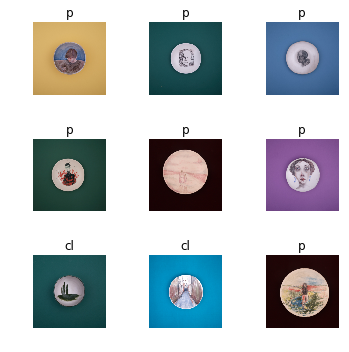

In [9]:
data.show_batch(rows=3, figsize=(5,5))


In [13]:
learn = create_cnn(data, models.resnet50, metrics=accuracy)


In [13]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


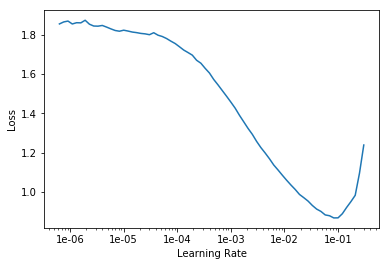

In [14]:
learn.recorder.plot()

In [14]:
learn.fit_one_cycle(3,1e-3)

epoch,train_loss,valid_loss,accuracy
1,1.666721,1.307117,0.318182
2,1.289471,1.247336,0.409091
3,1.043244,1.186462,0.545455


In [16]:
learn.save('stage-1-50')


In [17]:
interp = ClassificationInterpretation.from_learner(learn)

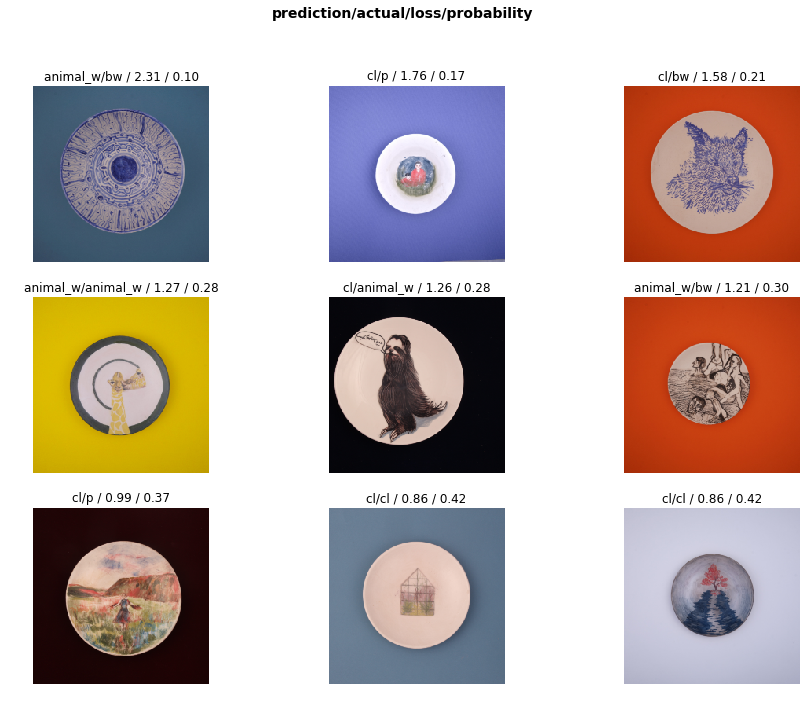

In [18]:
interp.plot_top_losses(9 , figsize=(15,11))

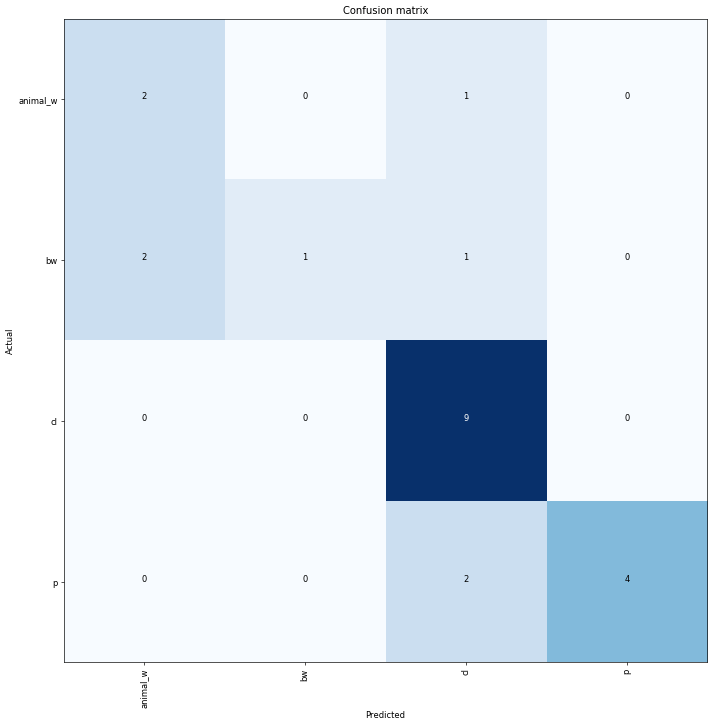

In [19]:
interp.plot_confusion_matrix(figsize=(12,12), dpi = 60)

In [16]:
learn.unfreeze()

In [ ]:
learn.fit_one_cycle(3)

epoch,train_loss,valid_loss,accuracy


In [9]:
learn.save('stage-2-50')

Learner(data=ImageDataBunch;

Train: LabelList
y: CategoryList (202 items)
[Category bw, Category bw, Category bw, Category bw, Category bw]...
Path: data
x: ImageItemList (202 items)
[Image (3, 1280, 1920), Image (3, 1280, 1920), Image (3, 1280, 1920), Image (3, 1280, 1920), Image (3, 1280, 1920)]...
Path: data;

Valid: LabelList
y: CategoryList (22 items)
[Category p, Category cl, Category bw, Category bw, Category bw]...
Path: data
x: ImageItemList (22 items)
[Image (3, 3456, 5184), Image (3, 1280, 1920), Image (3, 1280, 1920), Image (3, 1280, 1920), Image (3, 1280, 1920)]...
Path: data;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64

In [23]:
learn.model.children

<bound method Module.children of Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace)
        (downsample): Sequential(
      

In [24]:
target_layer = learn.model[0][7][2]
target_layer

Bottleneck(
  (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace)
)

In [25]:
fmap_hook = hook_output(target_layer)

In [26]:
i = 5
image_batch, label_batch = next(iter(learn.data.train_dl))
image = image_batch[i].reshape(1, 3, 224, 224)

In [27]:
img_path ='data/train/bw/IMG_5791.jpg'

In [28]:
img = open_image(img_path)


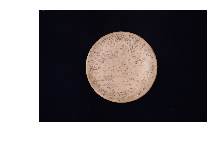

In [29]:
img.show()

In [30]:
learn.predict(img)


(Category bw,
 tensor(1),
 tensor([1.2070e-02, 9.8560e-01, 1.5334e-03, 7.9675e-04]))

In [31]:
layers = flatten_model(learn.model)

In [32]:
len(layers)


134

In [33]:
custom_hook = hook_outputs(layers)

In [34]:
learn.model.eval();


In [35]:
img = open_image(img_path)


In [36]:
learn.predict(img)


(Category bw,
 tensor(1),
 tensor([1.2070e-02, 9.8560e-01, 1.5334e-03, 7.9675e-04]))

In [37]:
len(custom_hook.stored)


134

In [38]:
[custom_hook.stored[i].shape for i in range(len(custom_hook.stored))]

[torch.Size([1, 64, 112, 112]),
 torch.Size([1, 64, 112, 112]),
 torch.Size([1, 64, 112, 112]),
 torch.Size([1, 64, 56, 56]),
 torch.Size([1, 64, 56, 56]),
 torch.Size([1, 64, 56, 56]),
 torch.Size([1, 64, 56, 56]),
 torch.Size([1, 64, 56, 56]),
 torch.Size([1, 256, 56, 56]),
 torch.Size([1, 256, 56, 56]),
 torch.Size([1, 256, 56, 56]),
 torch.Size([1, 256, 56, 56]),
 torch.Size([1, 256, 56, 56]),
 torch.Size([1, 64, 56, 56]),
 torch.Size([1, 64, 56, 56]),
 torch.Size([1, 64, 56, 56]),
 torch.Size([1, 64, 56, 56]),
 torch.Size([1, 256, 56, 56]),
 torch.Size([1, 256, 56, 56]),
 torch.Size([1, 256, 56, 56]),
 torch.Size([1, 64, 56, 56]),
 torch.Size([1, 64, 56, 56]),
 torch.Size([1, 64, 56, 56]),
 torch.Size([1, 64, 56, 56]),
 torch.Size([1, 256, 56, 56]),
 torch.Size([1, 256, 56, 56]),
 torch.Size([1, 256, 56, 56]),
 torch.Size([1, 128, 56, 56]),
 torch.Size([1, 128, 56, 56]),
 torch.Size([1, 128, 28, 28]),
 torch.Size([1, 128, 28, 28]),
 torch.Size([1, 512, 28, 28]),
 torch.Size([1, 51

In [39]:
custom_hook.stored[-2][0].shape

torch.Size([512])

In [41]:
cmap = 'inferno'


In [42]:
stored_hooks_rank = [len(custom_hook.stored[i].shape) for i in range(len(custom_hook.stored))]

In [43]:
min_rank = min([len(custom_hook.stored[i].shape) for i in range(len(custom_hook.stored))]); min_rank

2

In [44]:
first_flat_layer = stored_hooks_rank.index(min_rank); first_flat_layer


126

In [45]:
def show_activation(hook ,l=0, nrows=3, ncols=9, s=12, cmap=cmap):
   
    fig, axes = plt.subplots(nrows, ncols, figsize=(s,s))
    fig.subplots_adjust(hspace=0.1, wspace=0, left=0, right=1, top=1, bottom=0)
    for i, ax in enumerate(axes.flat):
        ax.imshow(custom_hook.stored[l][0][i].cpu(), cmap=cmap)
        ax.set_axis_off()

Layer: 0


Traceback (most recent call last):
  File "/home/b/anaconda3/envs/fastai_v1/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/home/b/anaconda3/envs/fastai_v1/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/b/anaconda3/envs/fastai_v1/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/home/b/anaconda3/envs/fastai_v1/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe
Traceback (most recent call last):
  File "/home/b/anaconda3/envs/fastai_v1/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/home/b/anaconda3/envs/fastai_v1/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/home/b/anaconda3/envs/fastai_v1/lib/python3

Layer: 20
Layer: 40
Layer: 60
Layer: 80
Layer: 100
Layer: 120


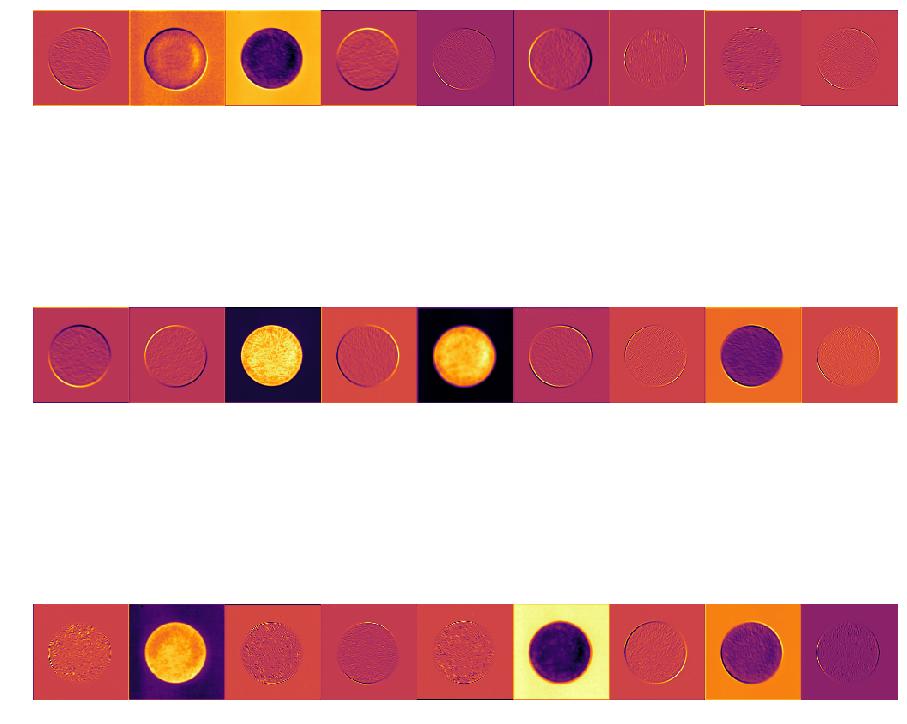

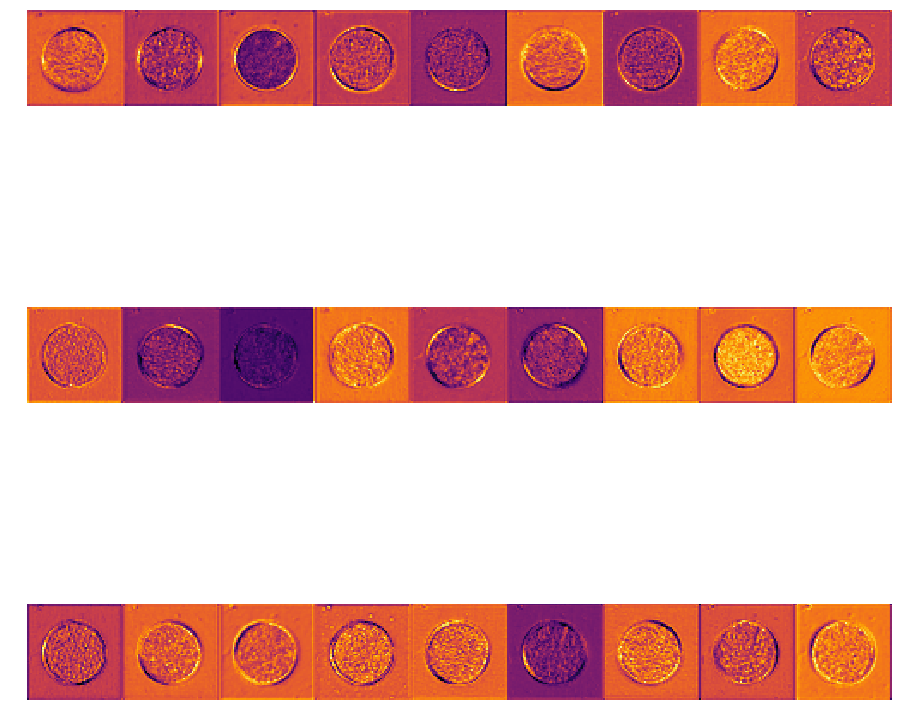

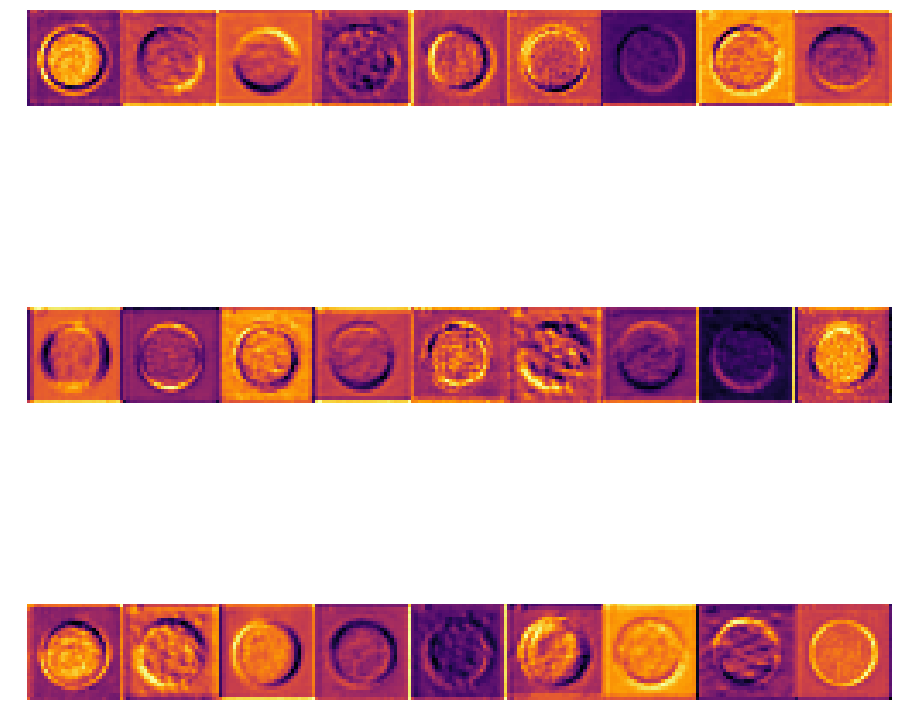

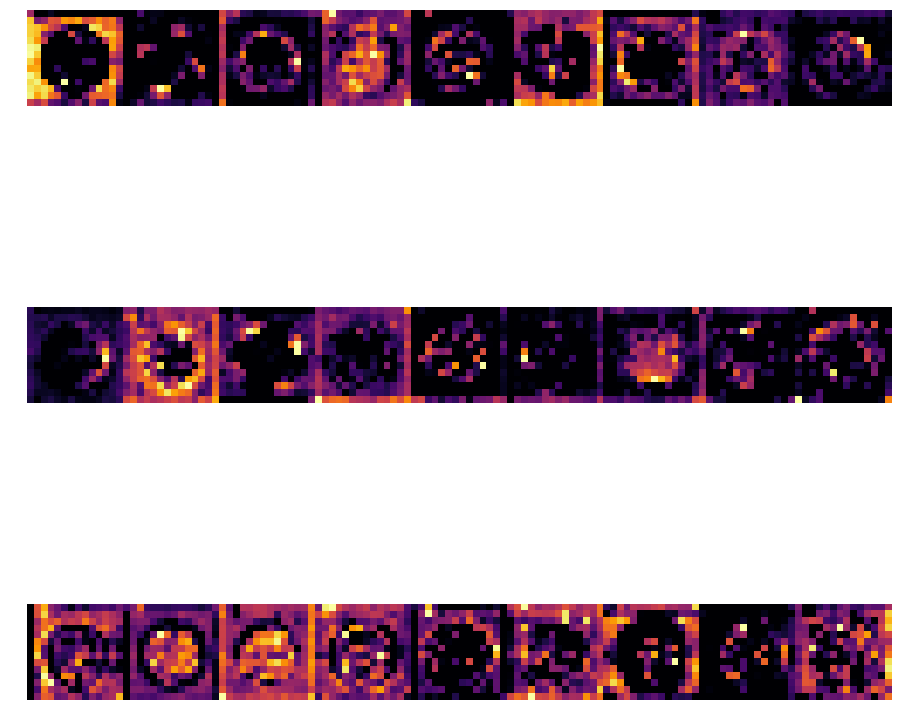

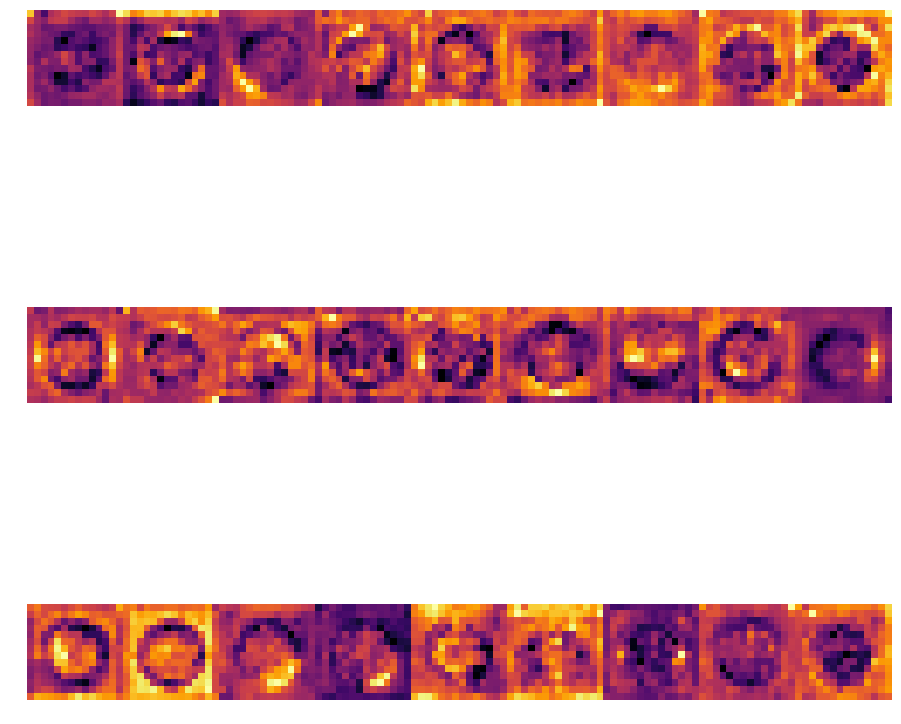

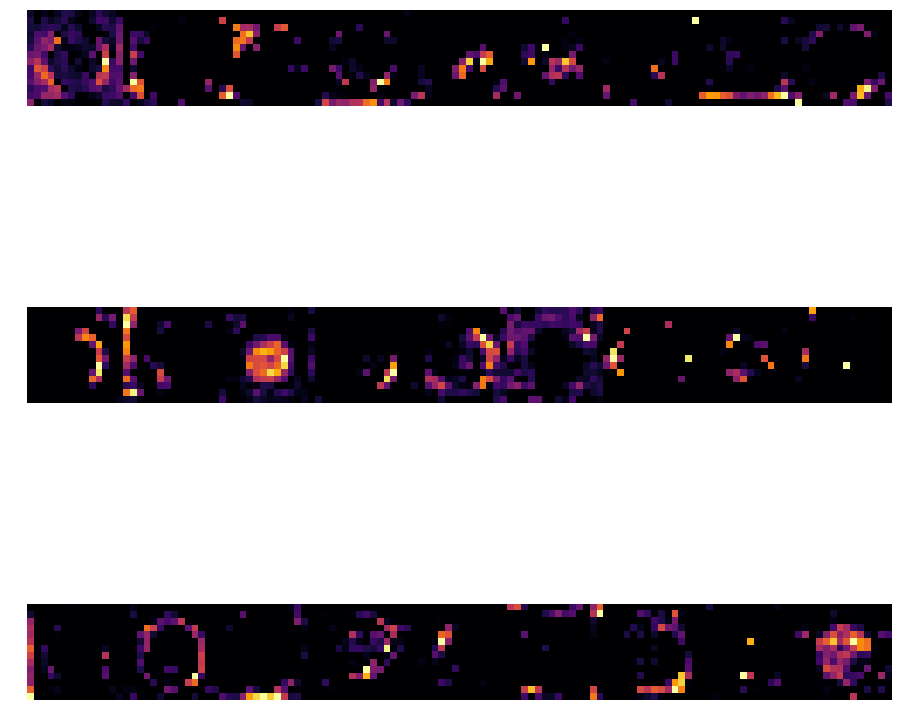

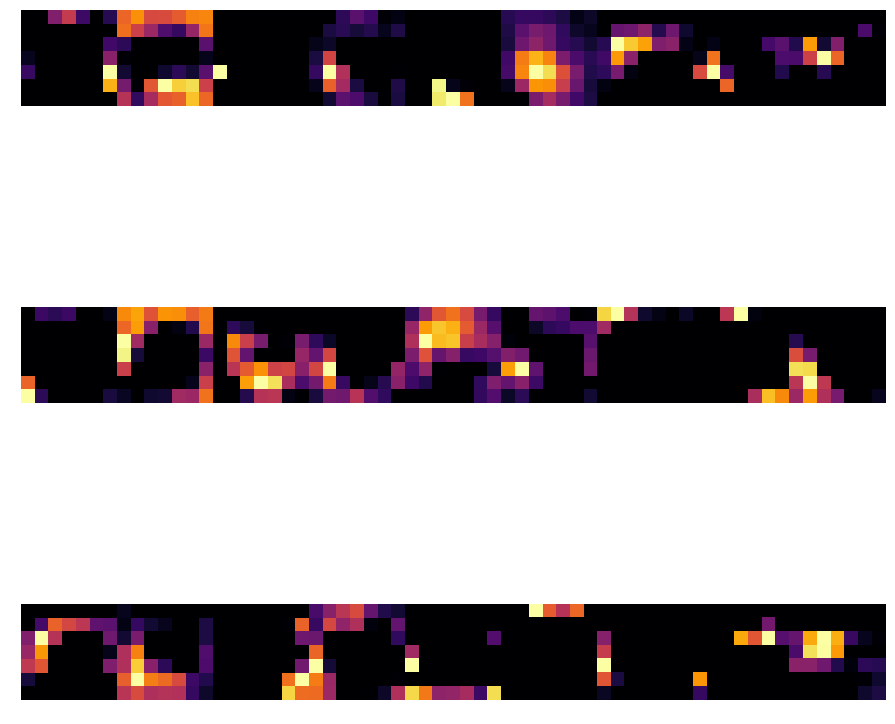

In [47]:
for i in range(0,first_flat_layer,20):
    print('Layer:',i)
    show_activation(custom_hook, i)

In [48]:
import nmslib

def create_index(a):
    index = nmslib.init(space='angulardist')
    index.addDataPointBatch(a)
    index.createIndex()
    return index

def get_knns(index, vecs):
     return zip(*index.knnQueryBatch(vecs, k=10, num_threads=4))

def get_knn(index, vec): return index.knnQuery(vec, k=10)

In [49]:
import glob

In [60]:
pat = 'data/train/p'

In [61]:
all_files = glob.glob(os.path.join(pat, "*"))

In [62]:
all_files[:5]

['data/train/p/SABE4402.jpg',
 'data/train/p/SABE2509.jpg',
 'data/train/p/SABE2410.jpg',
 'data/train/p/IMG_5755.jpg',
 'data/train/p/IMG_5749.jpg']

In [63]:
img_features = list()
i=1
for f in all_files:
    learn = create_cnn(data, models.resnet50, metrics=accuracy)
    learn.load('stage-1-50')
    layers = flatten_model(learn.model)
    custom_hook = hook_outputs(layers)
    learn.model.eval();
    img = open_image(f)
    learn.predict(img)
    feat = custom_hook.stored[-2][0]
    img_features.append(feat)
    print(i)
    i=i+1

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88


In [64]:
img_features[1].shape

torch.Size([512])

In [65]:
img_features[2]

tensor([-3.7336e-03,  4.7174e-01,  4.9125e-01, -3.2838e-01, -3.2238e-01,
         1.9836e-01,  3.7696e-01, -2.7908e-01, -3.8142e-02, -2.2350e-01,
        -6.5506e-02, -2.7204e-01, -8.4590e-03, -2.8342e-01, -3.6204e-02,
         2.9425e-01, -2.9543e-01, -1.9512e-01, -1.8953e-01, -2.9211e-01,
        -2.5920e-01,  2.9529e-03, -6.9583e-02,  7.1473e-04,  6.5348e-02,
         5.0628e-01, -2.0090e-01, -1.1473e-01, -2.8801e-01, -9.2627e-02,
        -3.0882e-01,  1.7957e+00,  1.4461e+00, -8.3134e-02, -1.1347e-01,
         3.3118e-01, -3.0720e-01,  3.0833e-02,  1.5167e-01, -3.6015e-02,
        -8.7900e-02, -1.4974e-01, -8.5706e-02,  2.7898e-02, -4.3927e-02,
        -2.7565e-01, -2.9157e-01,  4.7256e-01, -2.1356e-01, -1.9988e-01,
         1.2351e+00, -9.1609e-02, -3.0628e-01, -2.3616e-01, -2.8653e-01,
        -3.4313e-02, -1.1993e-01,  6.4507e-02,  6.5983e-01, -2.6066e-01,
         4.6720e-01, -3.9167e-02,  1.0934e+00,  2.4944e-01,  1.7882e+00,
         2.0896e-01, -1.3071e-01,  5.8902e-02,  4.5

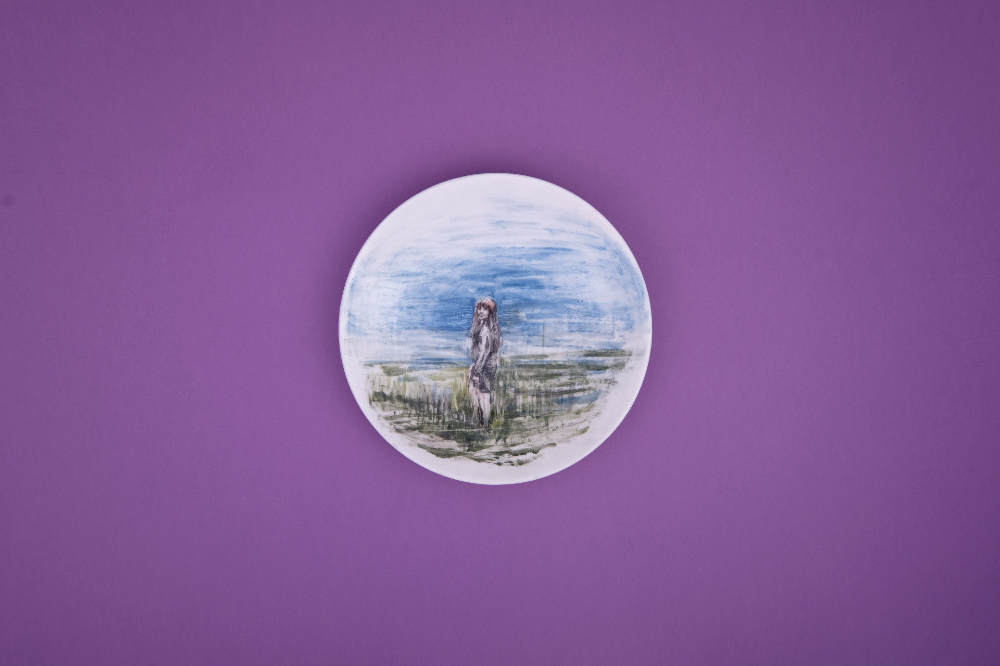

In [66]:
open_image(all_files[2])

In [67]:
img_features[2].shape

torch.Size([512])

In [68]:
nn=create_index(img_features)

In [69]:
idxs,dists = get_knn(nn,img_features[4])

In [70]:
 for i in idxs[:5]:
    print(i)

4
9
12
72
79


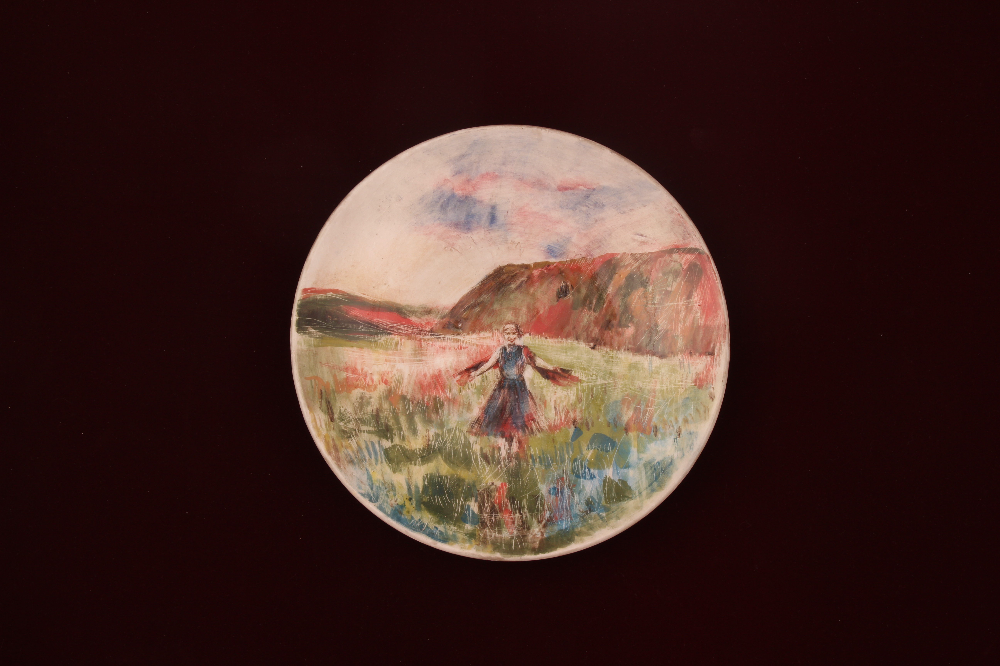

In [71]:
open_image(all_files[9])